## Benchmarking small-variant genotyping in polyploids

This notebook contains all the commands required to reproduce all of the results presented in the paper Cooke et al. (2020). All of the data can be downloaded from public sources, although some have protected access and require login. The script does not check software versions so you'll need to manually check you are using all of the right tool versions if trying to reproduce the paper results exactly. I'm not checking or updating any of the data hard-coded links so please submit issues or pull requests if any stop working.

All of the banana reads we used, generated by Busche et al (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6945009/), are hosted on ENA (https://www.ebi.ac.uk/ena/browser/view/PRJEB33317)

In [1]:
%matplotlib notebook

In [2]:
import os
import shutil
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import pandas as pd
import numpy as np
import subprocess as sp
import gzip
import pysam as ps
import csv
from pathlib import Path
from matplotlib.ticker import FormatStrFormatter
import yaml

In [200]:
# Experiment directories and files
project_dir = Path().absolute().parents[1]
data_dir = project_dir / "data"
config_dir = project_dir / "config"
results_dir = project_dir / "results"
truth_dir = data_dir / "truth"
calls_dir = results_dir / "calls"
vcfeval_dir = results_dir / "eval"
figure_dir = results_dir / "figures"
tables_dir = results_dir / "tables"

all_callers = ["Octopus", "GATK4", "FreeBayes"]

caller_colours = {
    'Octopus': sns.xkcd_rgb["windows blue"],
    'GATK4': sns.xkcd_rgb["pale red"],
    'FreeBayes': sns.xkcd_rgb["faded green"]
}

caller_linestyles = {
    'Octopus': '',
    'GATK4': (1,2),
    'FreeBayes': (6,3)
}

In [14]:
def read_experiments(config_filename):
    with config_filename.open() as config_file:
        config = yaml.load(config_file, Loader=yaml.FullLoader)
        res = []
        for depth in config["depths"]:
            experiment = config.copy()
            experiment["depth"] = depth
            del experiment["depths"]
            res.append(experiment)
        return res

In [190]:
configs = [f for f in config_dir.iterdir() if f.is_file()]
experiments = []
for config in configs:
    try:
        experiments += read_experiments(config)
    except:
        continue

In [16]:
def vcf_index_exists(vcf_filename):
    vcf_index_filaneme = vcf_filename.with_suffix(vcf_filename.suffix + '.tbi')
    return vcf_index_filaneme.exists()

def remove_vcf_index(vcf_filename):
    vcf_index_filaneme = vcf_filename.with_suffix(vcf_filename.suffix + '.tbi')
    vcf_index_filaneme.unlink()

def remove_vcf(vcf_filename, index=True):
    vcf_filename.unlink()
    if index and vcf_index_exists(vcf_filename):
        remove_vcf_index(vcf_filename)

def read_variant_stats(vcf_filename, bed_filename=None):
    if bed_filename is not None:
        tmp_vcf_filename = vcf_filename.with_suffix(".highconf.vcf.gz")
        bcftools_view_cmd = ['bcftools', \
                             'view', \
                             '-R', bed_filename, \
                             '-O', 'z', \
                             '-o', tmp_vcf_filename, \
                             vcf_filename]
        sp.call(bcftools_view_cmd)
        sp.call(['tabix', tmp_vcf_filename])
        vcf_filename = tmp_vcf_filename
    vcf = ps.VariantFile(vcf_filename)
    sample = vcf.header.samples[0]
    num_records, num_alts, num_multiallelic = 0, 0, 0
    copy_numbers = {}
    for rec in vcf:
        num_records += 1
        copy_number = None
        if len(rec.alts) > 1:
            num_multiallelic += 1
            num_alts += len(rec.alts)
            copy_number = tuple([sum(1 for allele in rec.samples[sample].alleles if allele == alt) for alt in rec.alts])
        else:
            num_alts += 1
            copy_number = sum(1 for allele in rec.samples[sample].alleles if allele == rec.alts[0])
        if copy_number in copy_numbers:
            copy_numbers[copy_number] += 1
        else:
            copy_numbers[copy_number] = 1
    if bed_filename is not None:
        remove_vcf(vcf_filename)
    return {"num_records": num_records, \
            "num_alts": num_alts, \
            "num_multiallelic": num_multiallelic, \
            "copy_numbers": copy_numbers
           }
    
def sum_region_sizes(bed_filename):
    with open(bed_filename) as bed:
        res = 0
        for line in bed:
            fields = line.split('\t')
            res += int(fields[2]) - int(fields[1])
        return res

def print_truth_stats(truth_prefix):
    truth_vcf = truth_prefix.with_suffix(truth_prefix.suffix + '.vcf.gz')
    truth_bed = truth_prefix.with_suffix(truth_prefix.suffix + '.bed')
    num_highconf_bases = sum_region_sizes(truth_bed)
    genome_length = 2.9e9
    highconf_genome_fraction = float(num_highconf_bases) / genome_length
    print("High confidence bases", num_highconf_bases, "(" + str(int(100 * highconf_genome_fraction)) + " % of genome)")
    variant_stats = read_variant_stats(truth_vcf, truth_bed)
    print("# variants", variant_stats["num_records"])
    print("# alt alleles", variant_stats["num_alts"])
    print("# multallelics", variant_stats["num_multiallelic"])
    print("Copy numbers", variant_stats["copy_numbers"])

In [13]:
print_truth_stats(truth_dir / "HG003+HG004.hs38DH")

High confidence bases 2502710153 (86 % of genome)
# variants 5024814
# alt alleles 5095314
# multallelics 59895
Copy numbers {1: 2139003, 4: 827917, 3: 831791, 2: 1166208, (3, 1): 11159, (1, 3): 3234, (2, 2): 6029, (1, 1): 14178, (2, 1): 10239, (1, 2, 1): 1897, (1, 2): 5340, (1, 1, 2): 828, (2, 1, 1): 2919, (1, 1, 1, 1): 890, (1, 1, 1): 3181, (3, 0): 1}


In [16]:
print_truth_stats(truth_dir / "HG002+HG003+HG004.hs38DH")

High confidence bases 2489857451 (85 % of genome)
# variants 4965646
# alt alleles 5028566
# multallelics 53797
Copy numbers {1: 1068651, 6: 820288, 5: 411154, 4: 597142, 3: 772961, 2: 1241653, (5, 1): 6667, (3, 3): 3581, (2, 1): 8179, (3, 1): 4742, (4, 1): 2296, (3, 2): 2453, (2, 2): 4295, (4, 1, 1): 881, (2, 2, 2): 825, (2, 3): 2217, (4, 2): 5459, (1, 1): 2466, (3, 2, 1): 1579, (1, 2): 66, (2, 2, 1, 1): 731, (2, 1, 1): 1524, (2, 2, 1): 1265, (2, 3, 1): 1572, (2, 4): 2947, (1, 3): 36, (1, 2, 1): 11, (1, 1, 1): 3, (4, 0): 1, (3, 1, 1): 1}


In [138]:
def read_vcfeval_performance_summary(rtg_vcfeval_dir):
    with (rtg_vcfeval_dir / 'summary.txt').open() as summary:
        lines = summary.readlines()
        header, stats = lines[0].strip().split(), lines[-1].strip().split()
        result = pd.DataFrame([stats[1:]], columns=header[1:]).reset_index(drop=True)
        for column in result.columns:
            try:
                result[column] = pd.to_numeric(result[column])
            except: continue
        return result
    return None

def read_vcfeval_roc_header(rtg_vcfeval_roc_filename):
    with gzip.open(rtg_vcfeval_roc_filename, 'rt') as roc:
        result = None
        for line in roc:
            if line.startswith('#'):
                result = line.strip()[1:].split('\t')
            else:
                break
        return result

def get_vcfeval_roc_filename(variant_type):
    if variant_type == 'snv' or variant_type == 'snp':
        return 'snp_roc.tsv.gz'
    elif variant_type == 'indel':
        return 'non_snp_roc.tsv.gz'
    else:
        return 'weighted_roc.tsv.gz'

def read_vcfeval_roc(vcfeval_dir, variant_type='all'):
    roc = vcfeval_dir / get_vcfeval_roc_filename(variant_type)
    result = pd.read_csv(roc, sep='\t', comment='#')
    result.columns = read_vcfeval_roc_header(roc)
    return result

In [18]:
def add_precision_recall(ax, df, ylim=None, xlim=None, despine=True,
                         title=None, legend=True, legend_title=False,
                         y_format='%.3f', x_format='%.3f',
                         ylabel='Precision (PPV)', xlabel='Sensitivity'):
    if legend:
        legend = 'brief'
    callers = list(df["Caller"].unique())
    use_depth_lines = "Depth" in df and df["Depth"].nunique() > 1
    sns.lineplot(x="sensitivity", y="precision",
                 hue="Caller",
                 style="Depth" if use_depth_lines else "Caller",
                 palette=caller_colours,
                 #dashes=caller_linestyles,
                 hue_order=list(reversed(callers)),
                 legend=legend, data=df, ax=ax)
    ax.set(ylabel=ylabel, xlabel=xlabel)
    ax.yaxis.set_major_formatter(FormatStrFormatter(y_format))
    ax.xaxis.set_major_formatter(FormatStrFormatter(x_format))
    if legend and not legend_title:
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles=handles[1:], labels=labels[1:])
    if despine:
        sns.despine(ax=ax)
    if title is not None:
        ax.set(title=title)
    if ylim:
        ax.set_ylim(ylim[0], ylim[1])
    if xlim:
        ax.set_xlim(xlim[0], xlim[1])
    return ax

def add_marker(ax, x, y, colour, style='o', size=50):
    sns.regplot(x=np.array([x]), y=np.array([y]), scatter=True, fit_reg=False,
                marker=style, color=colour, scatter_kws={"s": size}, ax=ax)

def find_marker(df, caller, score):
    df = df.replace('None', 0)
    df['score'] = df['score'].apply(pd.to_numeric)
    for tol in [1e-10, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, .5]:
        lines = df[(df.caller == caller) & np.isclose(df.score, score, atol=tol)]
        if lines.shape[0] > 0:
            break
    if lines.shape[0] == 0:
        raise Exception("Could not find a PASS marker for " + caller)
    return float(lines['recall'].iloc[0]), float(lines['precision'].iloc[0])

def plot_precision_recall(df, 
                          ylim=None, xlim=None,
                          marker_scores=None,
                          title=None, legend_out=True,
                          y_format='%.1f', x_format='%.1f',
                          save=None, save_format='pdf'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(9, 6))
    add_precision_recall(ax, df, ylim=ylim, xlim=xlim, y_format=y_format, x_format=x_format, title=title)
    callers = list(df["Caller"].unique())
    if marker_scores is not None:
        for caller in reversed(callers):
            if caller in list(df['Caller'].unique()) and caller in marker_scores:
                try:
                    marker_x, marker_y = find_marker(df, caller, caller_pass_scores[caller])
                    add_marker(ax, marker_x, marker_y, caller_colours[caller])
                except:
                    print('Could not add PASS marker for ', caller)
    if legend_out:
        handles, labels = ax.get_legend_handles_labels()
        lgd = fig.legend(handles=reversed(handles), labels=reversed(labels),
                         frameon=False, loc='upper center',
                         bbox_to_anchor=(0.5, 1.03),
                         borderaxespad=0, ncol=len(labels))
        ax.legend_.remove()
    plt.tight_layout()
    if save is None:
        plt.show()
    else:
        plt.savefig(save, format=save_format, transparent=True, bbox_inches='tight')

def add_precision_recalls(axes, dfs, titles=None, ylims=None, xlims=None, y_format=None, x_format=None, xlabel='Sensitivity'):
    if titles is None:
        titles = len(dfs) * [None]
    for df, title, ax, ylim, xlim in zip(dfs, titles, axes, ylims, xlims):
        add_precision_recall(ax, df,
                             ylim=ylim, xlim=xlim,
                             y_format=y_format, x_format=x_format,
                             title=title,
                             legend_title=True,
                             xlabel=xlabel)
    for ax in axes[1:]:
        ax.set(ylabel='')

def add_markers(axes, marker_scores, dfs, titles):
    for title, ax in zip(titles, axes):
        df = dfs[title]
        for caller in reversed(callers):
            if caller in list(df['caller'].unique()) and caller in marker_scores:
                try:
                    marker_x, marker_y = find_marker(df, caller, caller_pass_scores[caller])
                    add_marker(ax, marker_x, marker_y, caller_colours[caller], size=25)
                except:
                    print('Could not add PASS marker for ', caller)

def plot_precision_recalls(dfs,
                           titles=None,
                           xlims=None, ylims=None,
                           y_format='%.1f', x_format='%.1f',
                           marker_scores=None,
                           ncols=4,
                           save=None, save_format='pdf'):
    sns.set(style="whitegrid")
    n_subplots = len(dfs)
    nrows, ncols = int(n_subplots/ncols), min(n_subplots, ncols)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols*ncols, 2*ncols*nrows))
    if ylims is None: 
        ylims = len(dfs) * [None]
    elif type(ylims) is not list:
        ylims = len(dfs) * [ylims]
    if xlims is None:
        xlims = len(dfs) * [None]
    elif type(xlims) is not list:
        xlims = len(dfs) * [xlims]
    for i in range(nrows - 1):
        add_precision_recalls(axes.flat[i*ncols:i*ncols+ncols], 
                              dfs[i*ncols:i*ncols+ncols], 
                              titles[i*ncols:i*ncols+ncols],
                              ylims=ylims[i*ncols:i*ncols+ncols],
                              xlims=xlims[i*ncols:i*ncols+ncols],
                              y_format=y_format, x_format=x_format,
                              xlabel='')
    add_precision_recalls(axes.flat[-ncols:],
                          dfs[-ncols:],
                          titles[-ncols:],
                          ylims=ylims, xlims=xlims,
                          y_format=y_format, x_format=x_format)
    if marker_scores is not None:
        add_markers(axes.flat, marker_scores, dfs, subplot_titles)
    handles, labels = axes.flat[-1].get_legend_handles_labels()
    lgd = fig.legend(handles=reversed(handles), labels=reversed(labels),
                     frameon=False, loc='upper center',
                     bbox_to_anchor=(0.5, 1.03),
                     borderaxespad=0, ncol=len(labels))
    for ax in axes.flat:
        ax.legend_.remove()
    plt.tight_layout()
    if save is None:
        plt.show()
    else:
        plt.savefig(save, format=save_format, transparent=True, bbox_extra_artists=[lgd], bbox_inches='tight')

In [137]:
def get_sample_name(experiment):
    return '+'.join(experiment["samples"])

def get_mapper(experiment):
    return "pbmm2" if experiment['library'] == "PacBioHiFi" else "bwa" 

def get_bam_prefix(experiment):
    return get_sample_name(experiment) + '.' + experiment['library'] + '.' + str(experiment["depth"]) + 'x.' + experiment["reference"] + '.' + get_mapper(experiment)

def get_vcfeval_dir(experiment, caller, genotypes=True, raw=True, combine=False):
    return vcfeval_dir / (get_bam_prefix(experiment) + '.' + caller + ('.raw' if raw else '.pass') + ('.CB' if combine else '.GT' if genotypes else '.AL') + '.vcfeval')

def read_vcfeval_df_helper(experiments, summary_df_getter, genotypes=True, raw=True, combine=False):
    dfs = []
    for experiment in experiments:
        sample = get_sample_name(experiment)
        for caller in experiment["callers"]:
            caller_vcfeval_dir = get_vcfeval_dir(experiment, caller, genotypes=experiment, raw=raw, combine=combine)
            if caller_vcfeval_dir.exists():
                try:
                    df = summary_df_getter(experiment, caller_vcfeval_dir)
                    df.insert(0, "Sample", sample)
                    df.insert(1, "Library", experiment["library"])
                    df.insert(2, "Depth", experiment["depth"])
                    df.insert(3, "Caller", caller)
                    dfs.append(df)
                except FileNotFoundError:
                    continue
    if len(dfs) > 0:
        return pd.concat(dfs).reset_index(drop=True)
    else:
        return None

def read_vcfeval_df_helper2(experiments, summary_df_getter, alleles=True, combine=False):
    dfs = []
    if combine:
        filtered_df = read_vcfeval_df_helper(experiments, summary_df_getter, combine=True, raw=False)
        if filtered_df is not None:
            filtered_df.insert(3, "Filtered", True)
            filtered_df.insert(4, "Match", "GT")
            dfs.append(filtered_df)
        raw_df = read_vcfeval_df_helper(experiments, summary_df_getter,  combine=True, raw=True)
        if raw_df is not None:
            raw_df.insert(3, "Filtered", False)
            raw_df.insert(4, "Match", "GT")
            dfs.append(raw_df)
    else:
        filtered_gt_df = read_vcfeval_df_helper(experiments, summary_df_getter, genotypes=True, raw=False)
        if filtered_gt_df is not None:
            filtered_gt_df.insert(3, "Filtered", True)
            filtered_gt_df.insert(4, "Match", "GT")
            dfs.append(filtered_gt_df)
        raw_gt_df = read_vcfeval_df_helper(experiments, summary_df_getter,  genotypes=True, raw=True)
        if raw_gt_df is not None:
            raw_gt_df.insert(3, "Filtered", False)
            raw_gt_df.insert(4, "Match", "GT")
            dfs.append(raw_gt_df)
        if alleles:
            filtered_alleles_df = read_vcfeval_df_helper(experiments, summary_df_getter,  genotypes=False, raw=False)
            if filtered_alleles_df is not None:
                filtered_alleles_df.insert(3, "Filtered", True)
                filtered_alleles_df.insert(4, "Match", "AL")
                dfs.append(filtered_alleles_df)
            raw_alleles_df = read_vcfeval_df_helper(experiments, summary_df_getter,  genotypes=False, raw=True)
            if raw_alleles_df is not None:
                raw_alleles_df.insert(3, "Filtered", False)
                raw_alleles_df.insert(4, "Match", "AL")
                dfs.append(raw_alleles_df)
    return pd.concat(dfs).reset_index(drop=True)

def read_vcfeval_performance_summaries(experiments):
    return read_vcfeval_df_helper2(experiments, lambda _, d: read_vcfeval_performance_summary(d))

def read_vcfeval_rocs(experiments):
    return read_vcfeval_df_helper2(experiments, lambda _, d: read_vcfeval_roc(d))

In [191]:
summary_df = read_vcfeval_performance_summaries(experiments)

In [192]:
summary_df

,Sample,Library,Depth,Filtered,Match,Caller,True-pos-baseline,True-pos-call,False-pos,False-neg,Precision,Sensitivity,F-measure
0,HG002+HG003+HG004,NovaSeq,10,True,GT,Octopus,2381085,2386869,1538852,2579640,0.6080,0.4800,0.5365
1,HG002+HG003+HG004,NovaSeq,10,True,GT,GATK4,2285625,2285448,1726416,2677577,0.5697,0.4605,0.5093
2,HG002+HG003+HG004,NovaSeq,10,True,GT,FreeBayes,2052653,2019021,1587348,2912546,0.5598,0.4134,0.4756
3,HG002+HG003+HG004,NovaSeq,20,True,GT,Octopus,3387916,3400627,1174324,1571487,0.7433,0.6831,0.7120
4,HG002+HG003+HG004,NovaSeq,20,True,GT,GATK4,3125832,3125465,1437170,1836228,0.6850,0.6299,0.6563
...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,HG002,NovaSeq,20,False,AL,FreeBayes,3832904,3750143,275137,57832,0.9316,0.9851,0.9576
240,HG002,NovaSeq,30,False,AL,Octopus,3862587,3889190,21235,28149,0.9946,0.9928,0.9937
241,HG002,NovaSeq,30,False,AL,GATK4,3859292,3859220,50980,31444,0.9870,0.9919,0.9894
242,HG002,NovaSeq,30,False,AL,FreeBayes,3849070,3765221,125378,41666,0.9678,0.9893,0.9784


In [194]:
summary_df.query("Sample=='HG003+HG004' and Library=='NovaSeq' and Depth==30")

,Sample,Library,Depth,Filtered,Match,Caller,True-pos-baseline,True-pos-call,False-pos,False-neg,Precision,Sensitivity,F-measure
36,HG003+HG004,NovaSeq,30,True,GT,Octopus,4649574,4681579,298790,374882,0.9400,0.9254,0.9326
37,HG003+HG004,NovaSeq,30,True,GT,GATK4,4379566,4378563,476941,644955,0.9018,0.8716,0.8864
38,HG003+HG004,NovaSeq,30,True,GT,FreeBayes,4316727,4228945,496032,707934,0.8950,0.8591,0.8767
60,HG003+HG004,NovaSeq,30,True,GT,Octopus_longhaps,4639214,4670869,294679,385257,0.9407,0.9233,0.9319
97,HG003+HG004,NovaSeq,30,False,GT,Octopus,4673553,4711016,326410,350709,0.9352,0.9302,0.9327
98,HG003+HG004,NovaSeq,30,False,GT,GATK4,4507791,4506778,580461,516704,0.8859,0.8972,0.8915
99,HG003+HG004,NovaSeq,30,False,GT,FreeBayes,4472391,4379486,1201034,552270,0.7848,0.8901,0.8341
121,HG003+HG004,NovaSeq,30,False,GT,Octopus_longhaps,4647224,4679095,297852,377242,0.9402,0.9249,0.9325
158,HG003+HG004,NovaSeq,30,True,AL,Octopus,4649574,4681579,298790,374882,0.9400,0.9254,0.9326
159,HG003+HG004,NovaSeq,30,True,AL,GATK4,4379566,4378563,476941,644955,0.9018,0.8716,0.8864


In [37]:
def calculate_f_measure(sensitivity, precision):
    return 2 * sensitivity * precision / (sensitivity + precision)

In [66]:
agg_summary_df = summary_df.query('Library=="NovaSeq" and Match=="GT"').groupby(["Filtered", "Caller"]).aggregate(sum).drop(columns=["Depth"]).reset_index()
agg_summary_df["Precision"] = agg_summary_df.apply(lambda x: x["True-pos-baseline"] / (x["True-pos-baseline"] + x["False-pos"]), axis=1)
agg_summary_df["Sensitivity"] = agg_summary_df.apply(lambda x: x["True-pos-baseline"] / (x["True-pos-baseline"] + x["False-neg"]), axis=1)
agg_summary_df["F-measure"] = agg_summary_df.apply(lambda x: calculate_f_measure(x["Sensitivity"], x["Precision"]), axis=1)

In [67]:
agg_summary_df

,Filtered,Caller,True-pos-baseline,True-pos-call,False-pos,False-neg,Precision,Sensitivity,F-measure
0,False,FreeBayes,81655418,80017333,22857580,14831552,0.781294,0.846284,0.812492
1,False,GATK4,82361107,82348272,14393151,14092776,0.851240,0.853891,0.852564
2,False,Octopus,84892534,85450916,9295563,11507302,0.901309,0.880629,0.890849
3,True,FreeBayes,78804543,77246938,12197832,17684208,0.865961,0.816723,0.840622
4,True,GATK4,80039222,80026389,11707907,16418433,0.872389,0.829786,0.850555
5,True,Octopus,84249562,84745919,8614672,12167806,0.907234,0.873801,0.890203


In [68]:
agg_summary_df.groupby("Caller").aggregate(lambda x: list(x)[1] / list(x)[0] if type(list(x)[0]) is not bool else None)

,Filtered,True-pos-baseline,True-pos-call,False-pos,False-neg,Precision,Sensitivity,F-measure
Caller,,,,,,,,
FreeBayes,None,0.965087,0.965378,0.533645,1.192337,1.108368,0.965069,1.034622
GATK4,None,0.971808,0.971804,0.813436,1.165025,1.024845,0.971770,0.997644
Octopus,None,0.992426,0.991750,0.926751,1.057399,1.006574,0.992246,0.999275


In [48]:
def add_accuracy_by_depth(ax, df, metric,
                          ylim=None,
                          despine=True, markers=True,
                          title=None, legend=True, legend_title=False,
                          y_format='%.2f',
                          xlabel='Depth'):
    if legend:
        legend = 'brief'
    callers = list(df["Caller"].unique())
    use_depth_lines = "Depth" in df and df["Depth"].nunique() > 1
    sns.lineplot(x="Depth", y=metric,
                 hue="Caller", style="Sample",
                 palette=caller_colours,
                 #dashes=caller_linestyles,
                 hue_order=list(reversed(callers)),
                 markers=markers,
                 legend=legend, data=df, ax=ax)
    ax.set(ylabel=metric, xlabel=xlabel)
    ax.yaxis.set_major_formatter(FormatStrFormatter(y_format))
    ax.yaxis.grid(True)
    ax.xaxis.grid(False)
    if legend and not legend_title:
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles=handles[1:], labels=labels[1:])
    if despine:
        sns.despine(ax=ax)
    if title is not None:
        ax.set(title=title)
    if ylim:
        ax.set_ylim(ylim[0], ylim[1])
    return ax

def plot_accuracy_by_depth(df, 
                           metric='F-measure',
                           ylim=None,
                           markers=True,
                           title=None, legend_out=True,
                           y_format='%.1f',
                           save=None, save_format='pdf'):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(9, 6))
    add_accuracy_by_depth(ax, df, metric, ylim=ylim, y_format=y_format, title=title)
    if legend_out:
        handles, labels = ax.get_legend_handles_labels()
        handles, labels = list(reversed(handles)), list(reversed(labels))
        n_samples = df["Sample"].nunique()
        del(handles[n_samples]); del(labels[n_samples])
        del(handles[-1]); del(labels[-1])
        labels[:n_samples] = [str(2 * (label.count('+') + 1)) + 'x' for label in reversed(labels[:n_samples])]
        handles[:n_samples] = reversed(handles[:n_samples])
        lgd = fig.legend(handles=handles, labels=labels,
                         frameon=False, loc='upper center',
                         bbox_to_anchor=(0.5, 1.03),
                         borderaxespad=0, ncol=len(labels))
        ax.legend_.remove()
    plt.tight_layout()
    if save is None:
        plt.show()
    else:
        plt.savefig(save, format=save_format, transparent=True, bbox_inches='tight')

def plot_accuracies_by_depth(df, metrics,
                             ylims=None,
                             markers=True,
                             legend_out=True,
                             y_format='%.1f',
                             save=None, save_format='pdf'):
    sns.set(style="whitegrid")
    ncols = len(metrics)
    fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols*5, 4))
    if ylims is not None and type(ylims) is tuple:
        ylims = ncols * [ylims]
    for ax, metric, ylim in zip(axes, metrics, ylims):
        add_accuracy_by_depth(ax, df, metric, ylim=ylim, y_format=y_format)
    if legend_out:
        handles, labels = ax.get_legend_handles_labels()
        handles, labels = list(reversed(handles)), list(reversed(labels))
        n_samples = df["Sample"].nunique()
        del(handles[n_samples]); del(labels[n_samples])
        del(handles[-1]); del(labels[-1])
        labels[:n_samples] = [str(2 * (label.count('+') + 1)) + 'x' for label in reversed(labels[:n_samples])]
        handles[:n_samples] = reversed(handles[:n_samples])
        lgd = fig.legend(handles=handles, labels=labels,
                         frameon=False, loc='upper center',
                         bbox_to_anchor=(0.5, 1.03),
                         borderaxespad=0, ncol=len(labels))
    for ax in axes.flat:
        ax.legend_.remove()
    plt.tight_layout()
    if save is None:
        plt.show()
    else:
        plt.savefig(save, format=save_format, transparent=True, bbox_inches='tight')

<IPython.core.display.Javascript object>


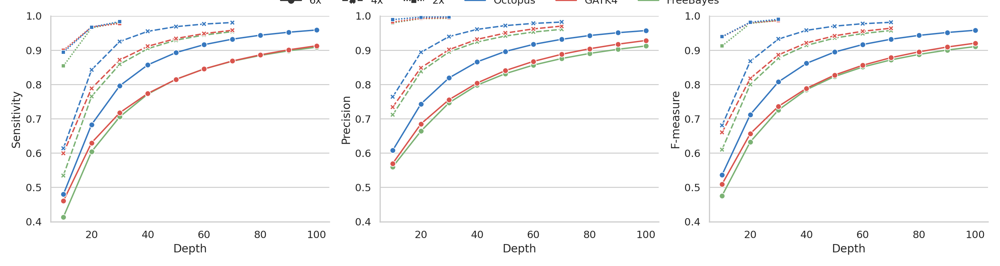

In [69]:
plot_accuracies_by_depth(summary_df.query('Match=="GT" and Library=="NovaSeq" and Filtered==True'),
                         ylims=(0.4, 1.), 
                         metrics=["Sensitivity", "Precision", "F-measure"],
                         save=figure_dir / "accuracies-by-depth.pdf")

<IPython.core.display.Javascript object>


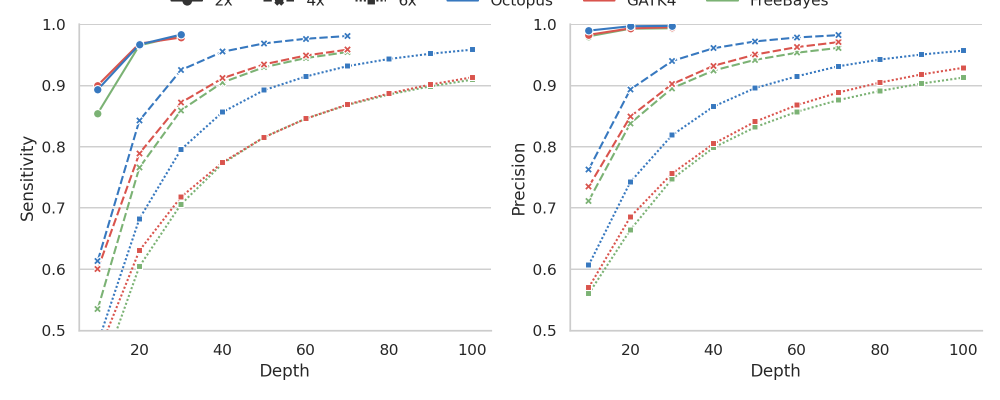

In [559]:
plot_accuracies_by_depth(summary_df.query('Match=="GT" and Library=="NovaSeq" and Filtered==True'),
                         ylim=(0.5, 1.), 
                         metrics=["Sensitivity", "Precision"],
                         save=figure_dir / "sensitivity-and-precision-by-depth.pdf")

<IPython.core.display.Javascript object>


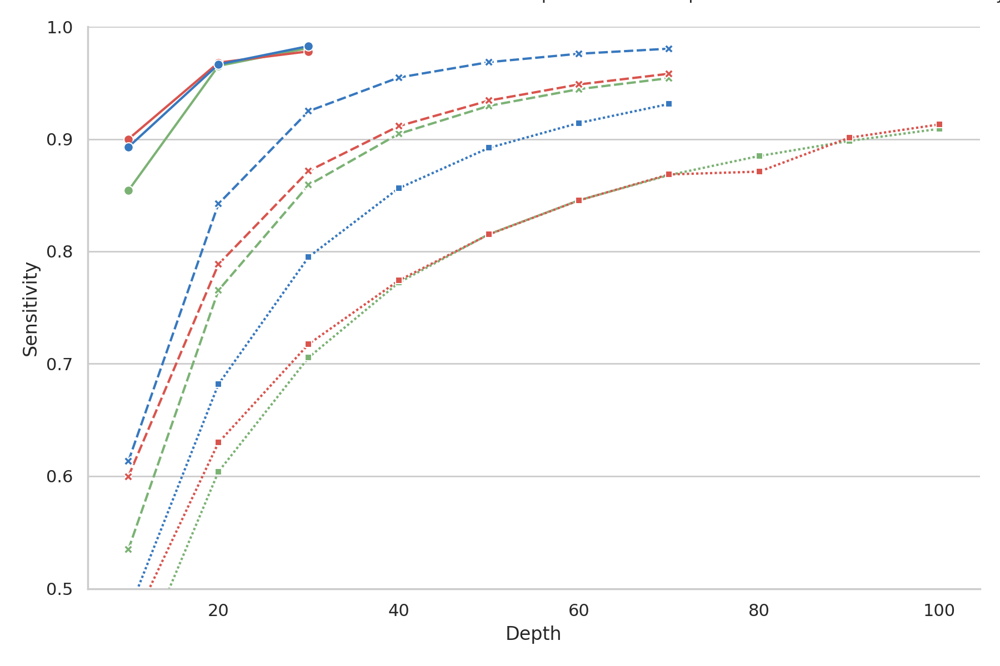

In [159]:
plot_accuracy_by_depth(summary_df.query('Filtered='), ylim=(0.5, 1.), 
                       metric="Sensitivity",
                       save=figure_dir / "sensitivity-by-depth.pdf")

<IPython.core.display.Javascript object>


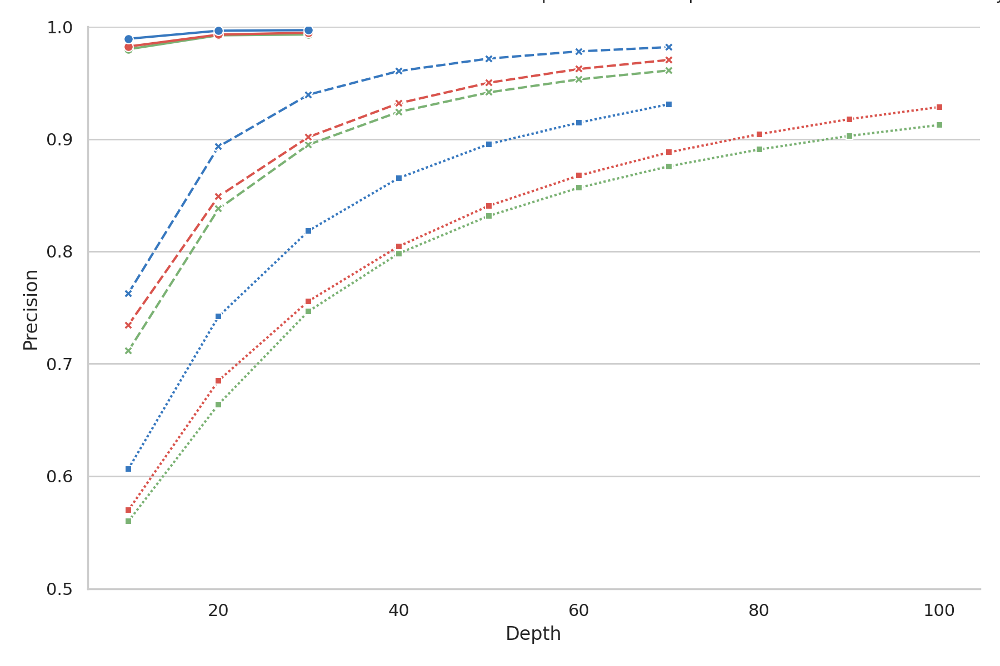

In [157]:
plot_accuracy_by_depth(summary_df.query('Filtered'), ylim=(0.5, 1.), 
                       metric="Precision",
                       save=figure_dir / "precision-by-depth.pdf")

In [ ]:
plot_accuracy_by_depth(summary_df.query('Library=="NovaSeq" and Filtered==True'), ylim=(0.5, 1.), 
                       metric="F-measure",
                       save=figure_dir / "f-measures-by-depth.pdf")

In [72]:
rocs = read_vcfeval_rocs(experiments)
filterd_rocs, raw_rocs = rocs.query('Filtered'), rocs.query('not Filtered')

<IPython.core.display.Javascript object>


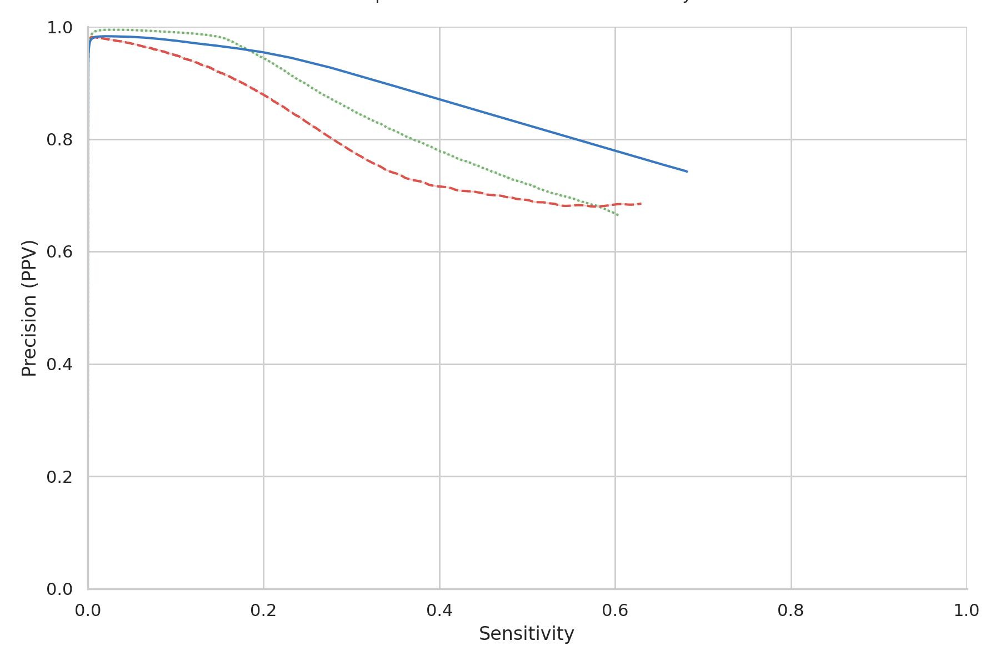

In [222]:
plot_precision_recall(filterd_rocs.query('Sample == "HG002+HG003+HG004" and Depth==20'), xlim=(0., 1.), ylim=(0., 1.))

<IPython.core.display.Javascript object>


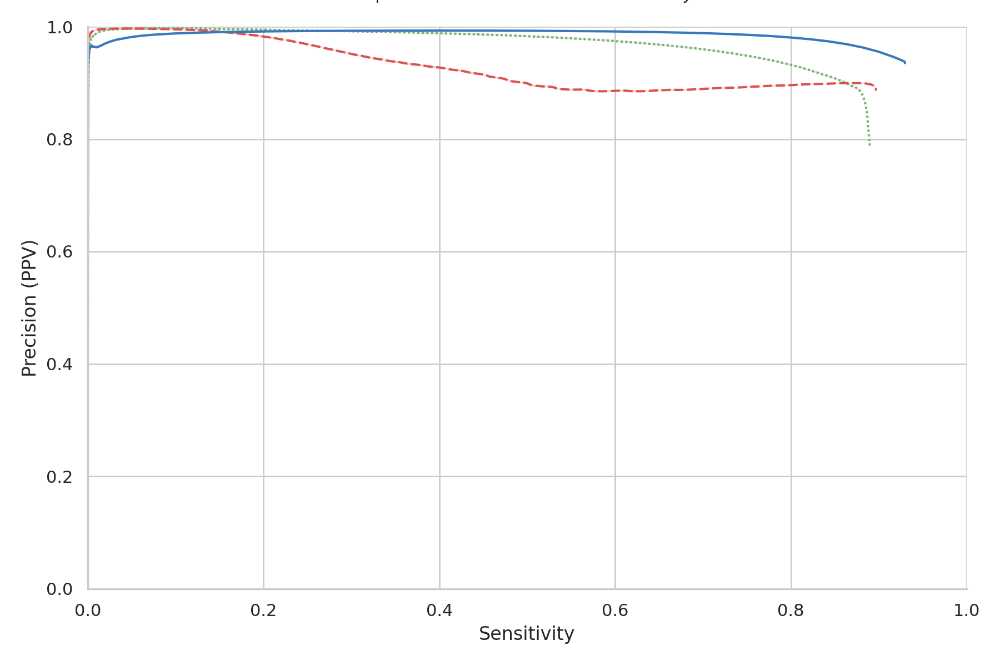

In [163]:
plot_precision_recall(raw_rocs.query('Depth==30'), xlim=(0., 1.), ylim=(0., 1.))

<IPython.core.display.Javascript object>


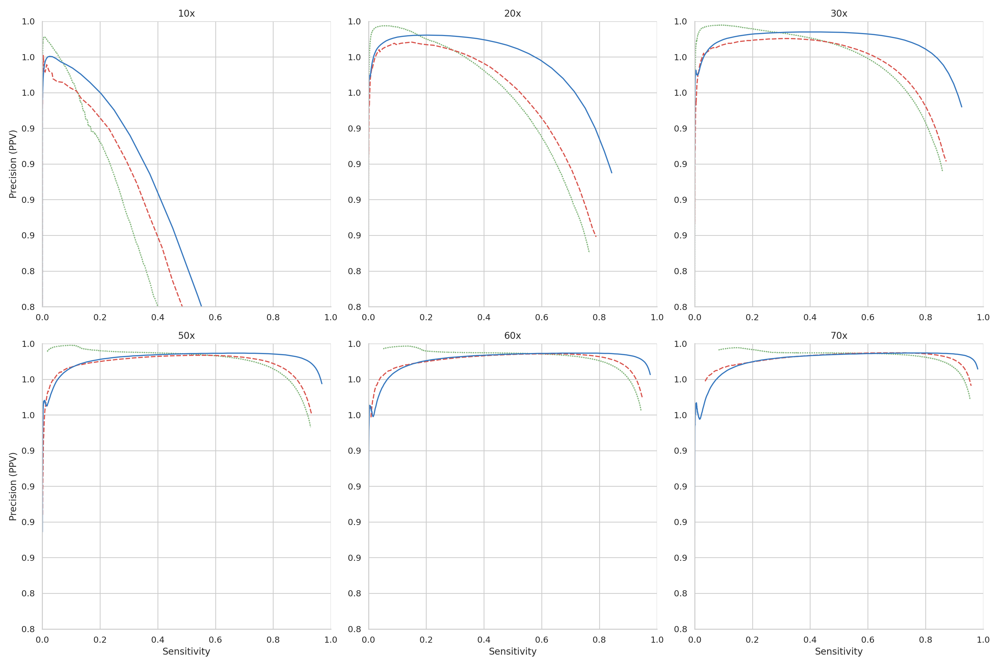

In [165]:
data = filterd_rocs.query('Match=="GT" and Sample=="HG003+HG004" and Library=="NovaSeq"')
depths = data["Depth"].unique()
plot_precision_recalls([data.query("Depth==" 
                                   + str(depth)) for depth in depths],
                       titles=[str(depth) + 'x' for depth in depths],
                       ncols=3,
                       xlims=(0., 1.), ylims=(0.8, 1.),
                       save=figure_dir / "synthetic-tetraploid-pr-curves.pdf")

<IPython.core.display.Javascript object>


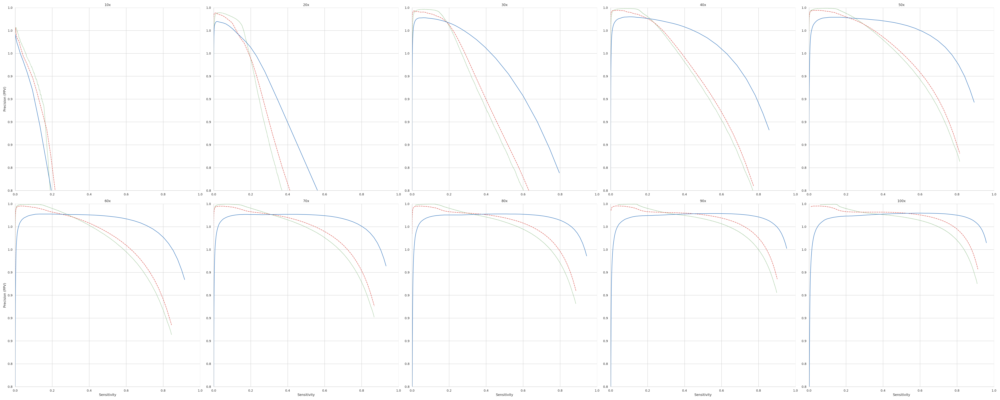

In [166]:
data = filterd_rocs.query('Match=="GT" and Sample=="HG002+HG003+HG004" and Library=="NovaSeq"')
depths = data["Depth"].unique()
plot_precision_recalls([data.query("Depth==" 
                                   + str(depth)) for depth in depths],
                       titles=[str(depth) + 'x' for depth in depths],
                       ncols=5,
                       xlims=(0., 1.), ylims=(0.8, 1.),
                       save=figure_dir / "synthetic-tetraploid-pr-curves.pdf")

<IPython.core.display.Javascript object>


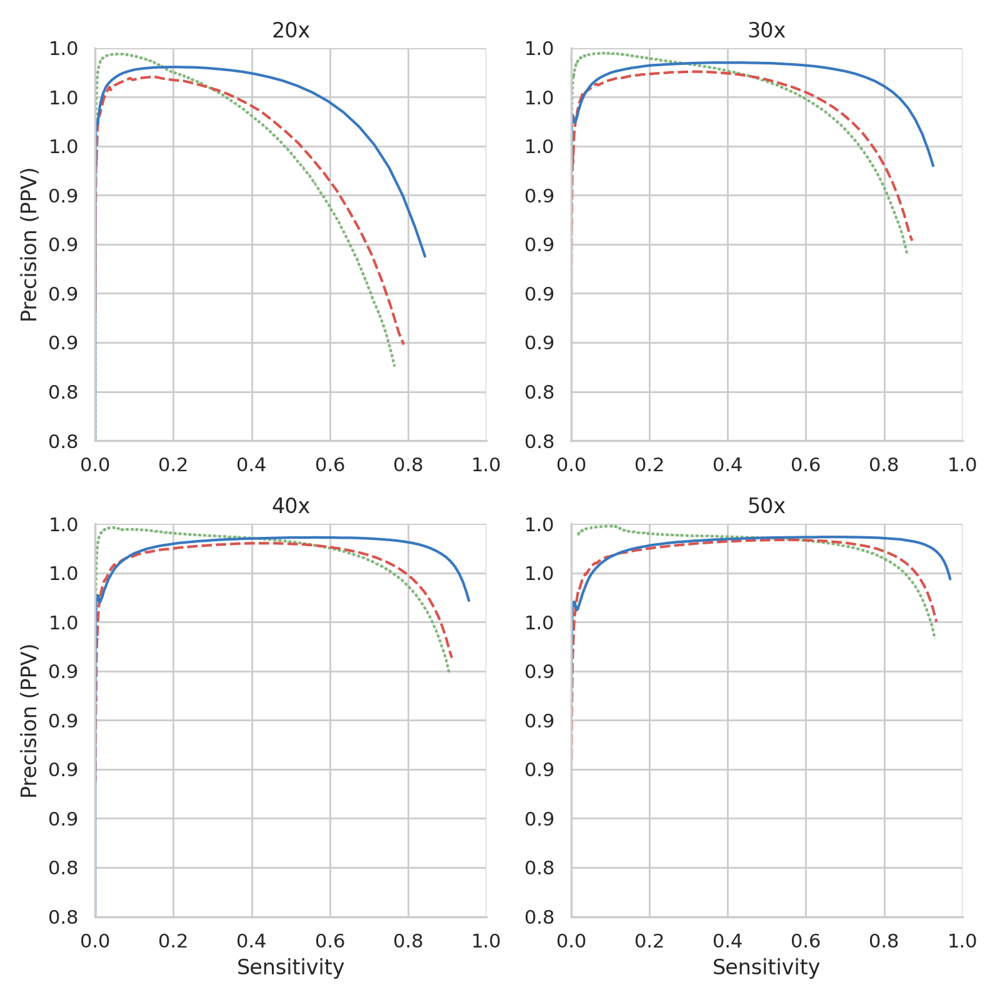

In [73]:
data = filterd_rocs.query('Match=="GT" and Sample=="HG003+HG004" and Library=="NovaSeq"')
depths = data["Depth"].unique()[1:5]
plot_precision_recalls([data.query("Depth==" 
                                   + str(depth)) for depth in depths],
                       titles=[str(depth) + 'x' for depth in depths],
                       ncols=2,
                       xlims=(0., 1.), ylims=(0.8, 1.),
                       save=figure_dir / "synthetic-tetraploid-pr-curves_20-50x.pdf")

<IPython.core.display.Javascript object>


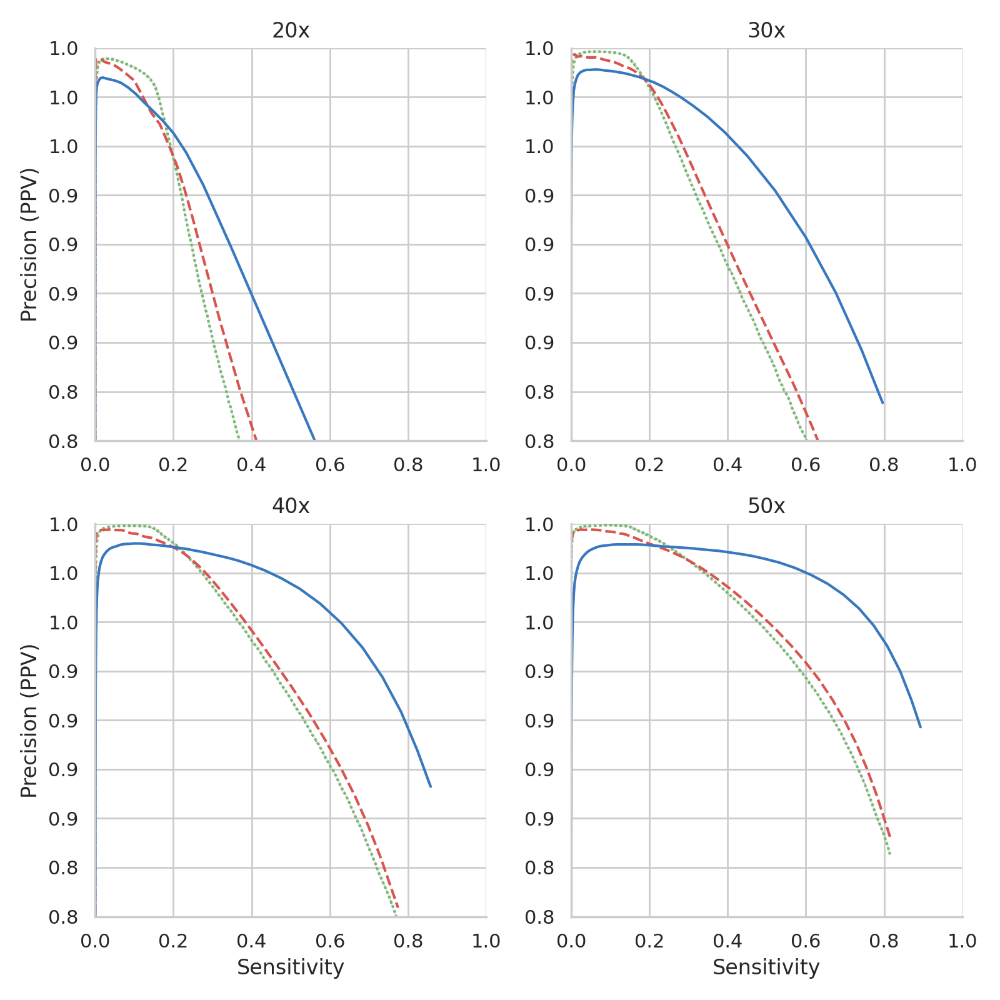

In [74]:
data = filterd_rocs.query('Match=="GT" and Sample=="HG002+HG003+HG004" and Library=="NovaSeq"')
depths = data["Depth"].unique()[1:5]
plot_precision_recalls([data.query("Depth==" + str(depth)) for depth in depths],
                       titles=[str(depth) + 'x' for depth in depths],
                       ncols=2,
                       xlims=(0., 1.), ylims=(0.8, 1.),
                       save=figure_dir / "synthetic-hexaploid-pr-curves_20-50x.pdf")

In [75]:
def read_truth_biallelic_gt_counts(sample, reference):
    truth_prefix = truth_dir / (sample + "." + reference)
    truth_vcf, truth_bed = truth_prefix.with_suffix(truth_prefix.suffix + '.vcf.gz'), truth_prefix.with_suffix(truth_prefix.suffix + '.bed')
    if not truth_vcf.exists():
        return None
    variant_stats = read_variant_stats(truth_vcf, truth_bed)
    ploidy = max([cn for cn, _ in variant_stats["copy_numbers"].items() if type(cn) is int])
    result = {}
    for alt_copies, count in variant_stats["copy_numbers"].items():
        if type(alt_copies) is int:
            ref_copies = ploidy - alt_copies
            gt = ref_copies * 'A' + alt_copies * 'a'
            result[gt] = count
    return result

def read_all_truth_biallelic_gt_counts(experiments):
    result = {}
    for experiment in experiments:
        key = '+'.join(experiment["samples"]), experiment["reference"]
        if key not in result:
            result[key] = read_truth_biallelic_gt_counts(key[0], key[1])
    return result

def read_biallelic_gt_errors(vcfeval_dir, ploidy, truth_counts=None):
    fn_stats = read_variant_stats(vcfeval_dir / "fn.vcf.gz")["copy_numbers"]
    fp_stats = read_variant_stats(vcfeval_dir / "fp.vcf.gz")["copy_numbers"]
    data = []
    total_fn, total_fp = 0, 0
    for ref_copies in range(0, ploidy):
        alt_copies = ploidy - ref_copies
        gt = ref_copies * 'A' + alt_copies * 'a'
        fn = fn_stats[alt_copies] if alt_copies in fn_stats else 0
        fp = fp_stats[alt_copies] if alt_copies in fp_stats else 0
        data += [[gt, "FN", fn], [gt, "FP", fp]]
        total_fn += fn
        total_fp += fp
    for d in data:
        if d[1] == "FN":
            d.append(float(d[2]) / total_fn)
        else:
            d.append(float(d[2]) / total_fp)
    columns=["GT", "Error", "Count", "Fraction"]
    if truth_counts is not None:
        for d in data:
            if d[1] == "FN":
                d.append(float(d[2]) / truth_counts[d[0]])
            else:
                d.append(None)
        columns.append("Truth-fraction")
    return pd.DataFrame(data, columns=columns)

def read_biallelic_error_profiles(experiments):
    truth_counts = read_all_truth_biallelic_gt_counts(experiments)
    return read_vcfeval_df_helper2(experiments, lambda experiment, d: read_biallelic_gt_errors(d, 2 * len(experiment["samples"]), truth_counts=truth_counts[('+'.join(experiment["samples"]), experiment["reference"])]), alleles=False)

In [77]:
biallelic_errors = read_biallelic_error_profiles(experiments)
filtered_biallelic_errors, raw_biallelic_errors = biallelic_errors.query('Filtered'), biallelic_errors.query('not Filtered')

In [78]:
filtered_biallelic_errors

,Sample,Library,Depth,Filtered,Match,Caller,GT,Error,Count,Fraction,Truth-fraction
0,HG002+HG003+HG004,NovaSeq,10,True,GT,Octopus,aaaaaa,FN,14527,0.005729,0.017710
1,HG002+HG003+HG004,NovaSeq,10,True,GT,Octopus,aaaaaa,FP,105929,0.069920,NaN
2,HG002+HG003+HG004,NovaSeq,10,True,GT,Octopus,Aaaaaa,FN,176607,0.069654,0.429540
3,HG002+HG003+HG004,NovaSeq,10,True,GT,Octopus,Aaaaaa,FP,156876,0.103548,NaN
4,HG002+HG003+HG004,NovaSeq,10,True,GT,Octopus,AAaaaa,FN,307239,0.121175,0.514516
...,...,...,...,...,...,...,...,...,...,...,...
559,HG002,NovaSeq,30,True,GT,GATK4,Aa,FP,19739,0.962737,NaN
560,HG002,NovaSeq,30,True,GT,FreeBayes,aa,FN,29139,0.426533,0.019459
561,HG002,NovaSeq,30,True,GT,FreeBayes,aa,FP,1856,0.076593,NaN
562,HG002,NovaSeq,30,True,GT,FreeBayes,Aa,FN,39177,0.573467,0.016618


In [79]:
num_false_pos = summary_df.query('Filtered and Match=="GT"')["False-pos"].sum()
num_biallelic_false_pos = filtered_biallelic_errors.query('Match=="GT" and Error=="FP"')["Count"].sum()
biallelic_false_pos_frac = num_biallelic_false_pos / num_false_pos
print("Biallelic FP %", 100 * biallelic_false_pos_frac)

Biallelic FP % 97.21881128747111


In [80]:
def plot_genotype_errors(df, split="Error", kind="Count",
                         ylabel=None,
                         legend=True,
                         title=True,
                         save=None, save_format='pdf'):
    g = sns.catplot(x="GT", y=kind,
                    hue="Caller", col=split,
                    palette=caller_colours,
                    kind='bar',
                    legend=legend,
                    data=df)
    for ax in g.axes.flat:
        ax.set_xlabel('')
        if title:
            if split == "Depth":
                ax.set_title(ax.get_title().split(' ')[-1] + 'x')
        else:
            ax.set_title(None)
    if ylabel is not None:
        g.axes.flat[0].set_ylabel(ylabel)
    if legend:
        handles, labels = g.axes.flat[-1].get_legend_handles_labels()
        lgd = g.fig.legend(handles=handles, labels=labels,
                         frameon=False, loc='upper center',
                         bbox_to_anchor=(0.5, 1.03),
                         borderaxespad=0, ncol=len(labels))
        g.legend.remove()
    plt.tight_layout()
    if save is None:
        plt.show()
    else:
        plt.savefig(save, format=save_format, transparent=True, bbox_inches='tight')

<IPython.core.display.Javascript object>


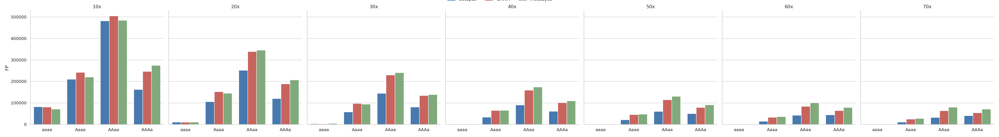

In [81]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG003+HG004' and Error=='FP'"),
                     kind="Count", split="Depth",
                     ylabel="FP",
                     save=figure_dir / "tetraploid_gt_fp.pdf")

<IPython.core.display.Javascript object>


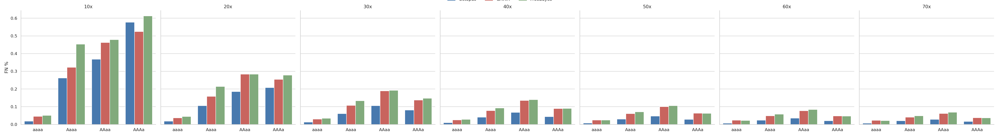

In [83]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG003+HG004' and Error=='FN'"),
                     kind="Truth-fraction", split="Depth",
                     ylabel="FN %",
                     save=figure_dir / "tetraploid_gt_fn_perc.pdf")

<IPython.core.display.Javascript object>


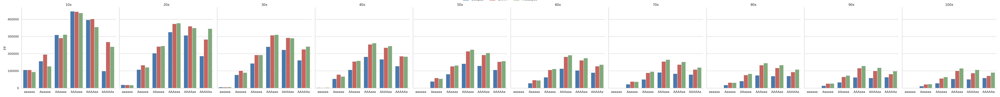

In [84]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG002+HG003+HG004' and Error=='FP'"),
                     kind="Count", split="Depth",
                     ylabel="FP",
                     save=figure_dir / "hexaploid_gt_fp.pdf")

<IPython.core.display.Javascript object>


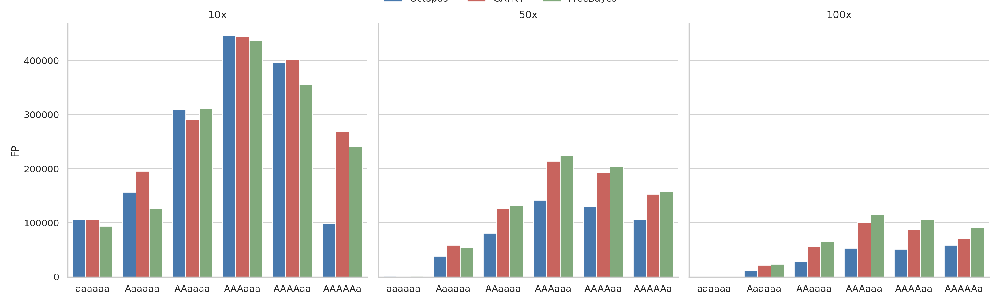

In [86]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG002+HG003+HG004' and (Depth==10 or Depth==50 or Depth==100) and Error=='FP'"),
                     kind="Count", split="Depth",
                     ylabel="FP",
                     save=figure_dir / "hexaploid_gt_fp_10x_50x_100x.pdf")

<IPython.core.display.Javascript object>


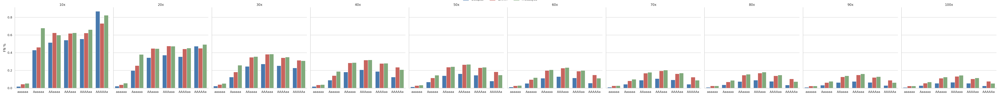

In [87]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG002+HG003+HG004' and Error=='FN'"),
                     kind="Truth-fraction", split="Depth",
                     ylabel="FN %",
                     save=figure_dir / "hexaploid_gt_fn_perc.pdf")

<IPython.core.display.Javascript object>


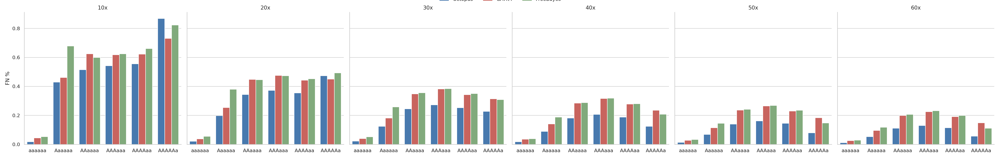

In [89]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG002+HG003+HG004' and 10<=Depth<=60 and Error=='FN'"),
                     kind="Truth-fraction", split="Depth",
                     ylabel="FN %",
                     save=figure_dir / "hexaploid_gt_fn_perc_10-60x.pdf")

<IPython.core.display.Javascript object>


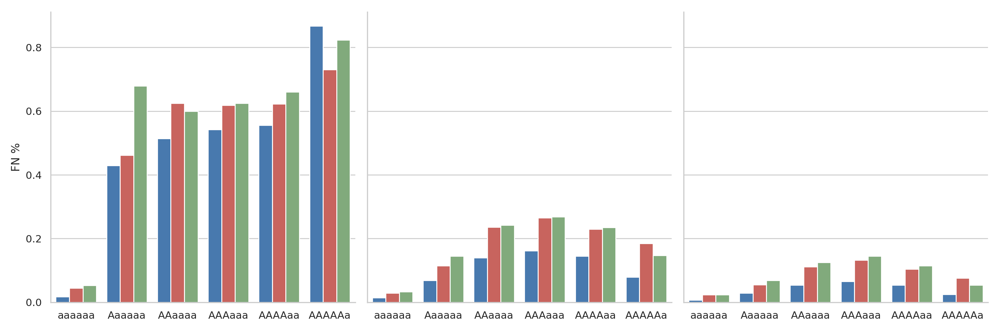

In [91]:
plot_genotype_errors(filtered_biallelic_errors.query("Library=='NovaSeq' and Sample=='HG002+HG003+HG004' and (Depth==10 or Depth==50 or Depth==100) and Error=='FN'"),
                     kind="Truth-fraction", split="Depth",
                     ylabel="FN %",
                     legend=False,
                     title=False,
                     save=figure_dir / "hexaploid_gt_fn_perc_10x_50x_100x.pdf")

In [92]:
def copy_number_to_genotype(alt_copy_number, ploidy):
    ref_copy_number = ploidy - alt_copy_number
    return 'A' * ref_copy_number + 'a' * alt_copy_number

In [118]:
def read_biallelic_gt_combined_mismatches(vcfeval_dir, ploidy, qsub=True):
    vcf = ps.VariantFile(vcfeval_dir / 'output.vcf.gz')
    data = []
    for rec in vcf:
        if rec.alts is not None and len(rec.alts) == 1:
            if 'BASE' in rec.info and rec.info['BASE'] == "FN_CA" and 'CALL' in rec.info and rec.info["CALL"] == "FP_CA":
                baseline_gt, call_gt = rec.samples["BASELINE"]["GT"], rec.samples["CALLS"]["GT"]
                if all(a is not None for a in baseline_gt) and all(a is not None for a in call_gt):
                    baseline_cn, call_cn = sum(baseline_gt), sum(call_gt)
                    error = baseline_cn - call_cn
                    data.append([copy_number_to_genotype(baseline_cn, ploidy), copy_number_to_genotype(call_cn, ploidy), error])
    return pd.DataFrame(data, columns=["Truth", "Call", "Error"])

def read_biallelic_copy_errors(experiments, qsub=True):
    result = read_vcfeval_df_helper2(experiments, lambda experiment, d: read_biallelic_gt_combined_mismatches(d, 2 * len(experiment["samples"]), qsub=qsub), combine=True)
    result = result.query("Error!=0").groupby(list(result.columns[:-1])).count().reset_index()
    result.drop(columns=["Match"], inplace=True)
    result.rename(columns={'Error': 'Total'}, inplace=True)
    return result

In [119]:
biallelic_copy_error_df = read_biallelic_copy_errors(experiments)
filtered_biallelic_copy_error_df, raw_biallelic_copy_error_df = biallelic_copy_error_df.query('Filtered'), biallelic_copy_error_df.query('not Filtered')

In [120]:
filtered_biallelic_copy_error_df

,Sample,Library,Depth,Filtered,Caller,Truth,Call,Total
6,HG002,NovaSeq,10,True,FreeBayes,Aa,aa,12085
7,HG002,NovaSeq,10,True,FreeBayes,aa,Aa,1225
8,HG002,NovaSeq,10,True,GATK4,Aa,aa,19047
9,HG002,NovaSeq,10,True,GATK4,aa,Aa,20212
10,HG002,NovaSeq,10,True,Octopus,Aa,aa,20132
...,...,...,...,...,...,...,...,...
2154,HG003+HG004,NovaSeq,70,True,Octopus,Aaaa,AAaa,11308
2155,HG003+HG004,NovaSeq,70,True,Octopus,Aaaa,aaaa,152
2156,HG003+HG004,NovaSeq,70,True,Octopus,aaaa,AAAa,31
2157,HG003+HG004,NovaSeq,70,True,Octopus,aaaa,AAaa,174


In [121]:
num_biallelic_copy_errors = filtered_biallelic_copy_error_df["Total"].sum()
num_biallelic_false_pos = filtered_biallelic_errors.query('Error=="FP"')["Count"].sum()
biallelic_copy_error_false_pos_frac = num_biallelic_copy_errors / num_biallelic_false_pos
print("Biallelic copy-error FP %", 100 * biallelic_copy_error_false_pos_frac)

Biallelic copy-error FP % 88.51663417937974


In [122]:
num_balanced_biallelic_false_pos = filtered_biallelic_errors.query('Error=="FP" and (GT=="AAaa" or GT=="AAAaaa")')["Count"].sum()
num_balanced_biallelic_copy_errors = filtered_biallelic_copy_error_df.query('Call=="AAaa" or Call=="AAAaaa"')["Total"].sum()
balanced_biallelic_copy_error_false_pos_frac = num_balanced_biallelic_copy_errors / num_balanced_biallelic_false_pos
print("Balanced biallelic copy-error FP %", 100 * balanced_biallelic_copy_error_false_pos_frac)

Balanced biallelic copy-error FP % 93.66238326638225


<IPython.core.display.Javascript object>


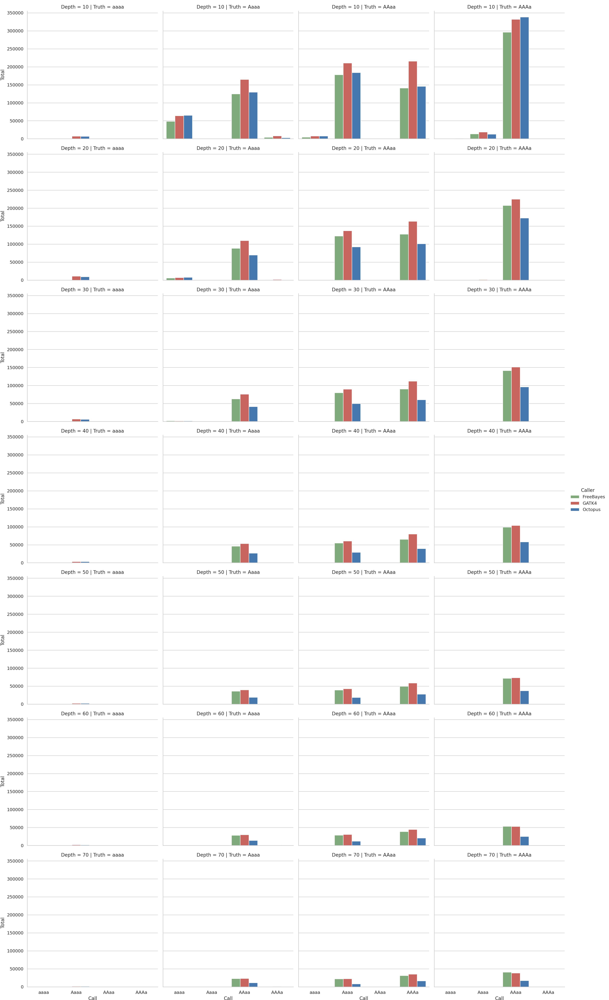

In [124]:
data = filtered_biallelic_copy_error_df.query('Sample =="HG003+HG004"')
sns.catplot(x="Call", y="Total",
            col='Truth',
            row='Depth',
            hue='Caller',
            palette=caller_colours,
            kind="bar",
            col_order=list(reversed(sorted(data["Truth"].unique()))),
            order=list(reversed(sorted(data["Truth"].unique()))),
            data=data)

In [126]:
data = filtered_biallelic_copy_error_df.query('Sample =="HG002+HG003+HG004"')
sns.catplot(x="Call", y="Total",
            col='Truth',
            row='Depth',
            hue='Caller',
            palette=caller_colours,
            kind="bar",
            col_order=list(reversed(sorted(data["Truth"].unique()))),
            order=list(reversed(sorted(data["Truth"].unique()))),
            data=data)

<IPython.core.display.Javascript object>

In [127]:
num_balanced_biallelic_copy_errors = filtered_biallelic_copy_error_df.query('Call=="AAaa" or Call=="AAAaaa"')["Total"].sum()
num_balanced_biallelic_copy_errors_plus_1 = filtered_biallelic_copy_error_df.query('(Call=="AAaa" and Truth=="Aaaa") or (Call=="AAAaaa" and Truth=="AAaaaa")')["Total"].sum()
num_balanced_biallelic_copy_errors_minus_1 = filtered_biallelic_copy_error_df.query('(Call=="AAaa" and Truth=="AAAa") or (Call=="AAAaaa" and Truth=="AAAAaa")')["Total"].sum()
num_balanced_biallelic_copy_errors_plus_1 / num_balanced_biallelic_copy_errors, num_balanced_biallelic_copy_errors_minus_1 / num_balanced_biallelic_copy_errors

(0.3352550021864432, 0.6476065295007503)

In [128]:
num_balanced_biallelic_copy_errors_minus_1 = filtered_biallelic_copy_error_df.query('(Truth=="AAaa" and Call=="Aaaa") or (Truth=="AAAaaa" and Call=="AAaaaa")')["Total"].sum()
num_balanced_biallelic_copy_errors_plus_1 = filtered_biallelic_copy_error_df.query('(Truth=="AAaa" and Call=="AAAa") or (Truth=="AAAaaa" and Call=="AAAAaa")')["Total"].sum()
num_balanced_biallelic_copy_errors_plus_1 / (num_balanced_biallelic_copy_errors_plus_1 + num_balanced_biallelic_copy_errors_minus_1)

0.5308731271502531

In [129]:
filtered_biallelic_copy_error_df.query('Truth=="AAaa" or Truth=="AAAaaa"').groupby(["Depth", "Truth", "Call"]).aggregate(sum)

Filtered   Total
Depth Truth  Call                    
10    AAAaaa AAAAAa         3   52026
             AAAAaa         3  476746
             AAaaaa         3  470466
             Aaaaaa         3   83112
             aaaaaa         3   12295
...                       ...     ...
100   AAAaaa AAAAAa         3    4015
             AAAAaa         3  126853
             AAaaaa         3   95543
             Aaaaaa         3     102
             aaaaaa         3      28

[71 rows x 2 columns]

In [130]:
def count_vcf_records(vcf_filename):
    vcf = ps.VariantFile(vcf_filename)
    return sum(1 for rec in vcf)

In [179]:
labels = []
for library in ["HiSeq", "NextSeq"]:
    for caller in ["Octopus", "GATK", "FreeBayes"]:
        labels.append(caller + "." + library)
isec_counts = []
expressions = []
banana_gt_isec_dir = vcfeval_dir / "banana.musa_acuminata.bwa.pass.GT.isec"
for file in banana_gt_isec_dir.iterdir():
    if file.suffix == ".gz" and file.name[0].isalpha():
        row = [False for _ in range(len(labels))]
        for label in file.name.split('.')[0]:
            row[ord(label) - ord('A')] = True
        count = count_vcf_records(file)
        hotlabels = '&'.join([labels[i] for i, x in enumerate(row) if x])
        expressions.append("'" + hotlabels + "'" + '=' + str(count))
        row.append(count)
        isec_counts.append(row)
banana_isec_df = pd.DataFrame(isec_counts, columns=[label.replace('.', '_') for label in labels] + ["Count"])
print(','.join(expressions))

'Octopus.HiSeq&FreeBayes.HiSeq&FreeBayes.NextSeq'=114235,'FreeBayes.HiSeq&GATK.NextSeq'=23966,'Octopus.NextSeq&GATK.NextSeq&FreeBayes.NextSeq'=161232,'GATK.NextSeq&FreeBayes.NextSeq'=149457,'Octopus.HiSeq&Octopus.NextSeq&GATK.NextSeq'=78726,'Octopus.HiSeq&GATK.HiSeq&FreeBayes.HiSeq&GATK.NextSeq'=72432,'Octopus.HiSeq&FreeBayes.HiSeq&GATK.NextSeq&FreeBayes.NextSeq'=35195,'Octopus.HiSeq&GATK.HiSeq&FreeBayes.HiSeq&Octopus.NextSeq&GATK.NextSeq&FreeBayes.NextSeq'=7031343,'Octopus.HiSeq&GATK.HiSeq&GATK.NextSeq'=76999,'FreeBayes.HiSeq'=690178,'GATK.HiSeq&FreeBayes.NextSeq'=33058,'FreeBayes.HiSeq&FreeBayes.NextSeq'=365678,'Octopus.HiSeq&GATK.HiSeq&FreeBayes.HiSeq&GATK.NextSeq&FreeBayes.NextSeq'=165102,'Octopus.HiSeq&GATK.HiSeq&Octopus.NextSeq&FreeBayes.NextSeq'=22858,'Octopus.HiSeq&GATK.NextSeq'=39247,'GATK.HiSeq&FreeBayes.HiSeq&Octopus.NextSeq&FreeBayes.NextSeq'=41608,'GATK.HiSeq&FreeBayes.HiSeq'=243927,'Octopus.HiSeq&Octopus.NextSeq&GATK.NextSeq&FreeBayes.NextSeq'=101694,'Octopus.HiSeq&FreeBa

In [180]:
banana_isec_df

,Octopus_HiSeq,GATK_HiSeq,FreeBayes_HiSeq,Octopus_NextSeq,GATK_NextSeq,FreeBayes_NextSeq,Count
0,True,False,True,False,False,True,114235
1,False,False,True,False,True,False,23966
2,False,False,False,True,True,True,161232
3,False,False,False,False,True,True,149457
4,True,False,False,True,True,False,78726
...,...,...,...,...,...,...,...
58,True,True,False,True,True,False,305795
59,False,False,True,True,False,True,98042
60,True,False,True,False,False,False,190996
61,False,True,False,True,False,False,43730


In [181]:
banana_isec_df['Count'].sum()

17151421

In [182]:
banana_isec_df.query('Octopus_HiSeq and Octopus_NextSeq').groupby(list(banana_isec_df.columns[:-1])).sum()["Count"]

Octopus_HiSeq  GATK_HiSeq  FreeBayes_HiSeq  Octopus_NextSeq  GATK_NextSeq  FreeBayes_NextSeq
True           False       False            True             False         False                 206573
                                                                           True                   48277
                                                             True          False                  78726
                                                                           True                  101694
                           True             True             False         False                  81891
                                                                           True                  370689
                                                             True          False                  34484
                                                                           True                  471928
               True        False            True             False         

In [183]:
def sum_counts(isec_df, caller, match):
    if match:
        return isec_df.query(caller + '_HiSeq and ' + caller + '_NextSeq').groupby(list(banana_isec_df.columns[:-1])).sum()["Count"].sum()
    else:
        res = 0
        res += isec_df.query('not ' + caller + '_HiSeq and ' + caller + '_NextSeq').groupby(list(banana_isec_df.columns[:-1])).sum()["Count"].sum()
        res += isec_df.query(caller + '_HiSeq and not ' + caller + '_NextSeq').groupby(list(banana_isec_df.columns[:-1])).sum()["Count"].sum()
        return res

In [184]:
banana_isec_totals = pd.DataFrame([
    ["Octopus", True, sum_counts(banana_isec_df, "Octopus", True)],
    ["Octopus", False, sum_counts(banana_isec_df, "Octopus", False)],
    ["GATK4", True, sum_counts(banana_isec_df, "GATK", True)],
    ["GATK4", False, sum_counts(banana_isec_df, "GATK", False)],
    ["FreeBayes", True, sum_counts(banana_isec_df, "FreeBayes", True)],
    ["FreeBayes", False, sum_counts(banana_isec_df, "FreeBayes", False)]
], columns=["Caller", "Concordant", "Genotypes"])

In [185]:
banana_isec_totals

,Caller,Concordant,Genotypes
0,Octopus,True,9876924
1,Octopus,False,3137618
2,GATK4,True,9023991
3,GATK4,False,4380314
4,FreeBayes,True,9768672
5,FreeBayes,False,3715655


In [186]:
banana_isec_totals_wide = banana_isec_totals.pivot(index='Caller', columns='Concordant', values='Genotypes')

In [187]:
banana_isec_totals_wide

Concordant,False,True
Caller,,
FreeBayes,3715655,9768672
GATK4,4380314,9023991
Octopus,3137618,9876924


In [188]:
with open(tables_dir / "banana_concorance_totals.tex", 'w') as table:
    table.write(banana_isec_totals_wide.to_latex(bold_rows=True))

<IPython.core.display.Javascript object>


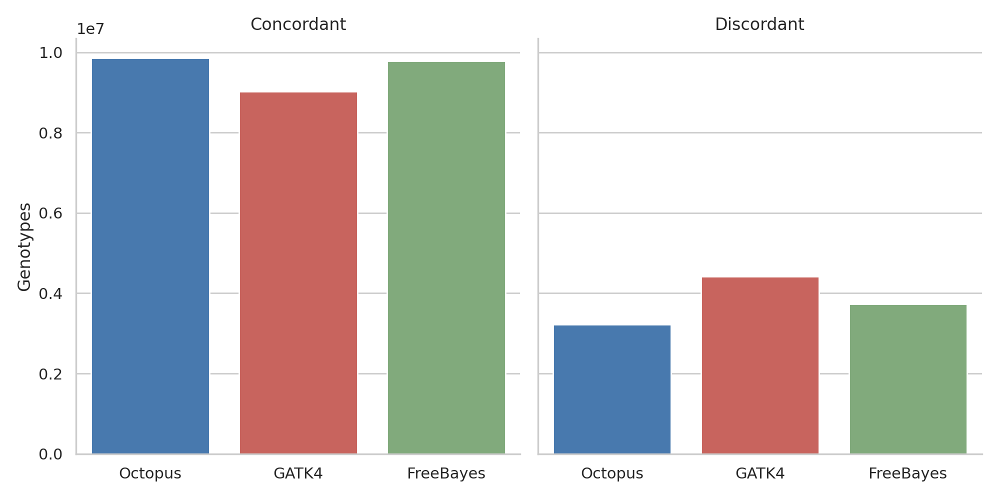

In [163]:
g = sns.catplot(x="Caller", y="Genotypes", 
                col="Concordant",
                kind='bar',
                col_order=[True, False],
                palette=caller_colours,
                data=banana_isec_totals)
g.axes.flat[0].set_title("Concordant")
g.axes.flat[1].set_title("Discordant")
g.axes.flat[0].set_xlabel("")
g.axes.flat[1].set_xlabel("")
plt.tight_layout()
plt.savefig(figure_dir / "banana_concorance_totals.pdf", format="pdf", transparent=True, bbox_inches='tight')

queries1 <- list(list(query = intersects, params = list("GATK.HiSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("GATK.NextSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("FreeBayes.HiSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("FreeBayes.NextSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("Octopus.HiSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.HiSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.HiSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.NextSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("GATK.HiSeq", "GATK.NextSeq", "FreeBayes.HiSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("GATK.HiSeq", "GATK.NextSeq", "FreeBayes.NextSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "FreeBayes.HiSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "FreeBayes.NextSeq"), color = "#7bb274", active = T), list(query = intersects, params = list("GATK.HiSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("GATK.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.HiSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.NextSeq"), color = "#d9544d", active = T), list(query = intersects, params = list("Octopus.HiSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.HiSeq", "GATK.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.HiSeq", "GATK.NextSeq"), color = "#3778bf", active = T), list(query = intersects, params = list("GATK.HiSeq", "FreeBayes.HiSeq"), color = "#fec615", active = T), list(query = intersects, params = list("GATK.NextSeq", "FreeBayes.NextSeq"), color = "#fec615", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.HiSeq"), color = "#9c6da5", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.NextSeq"), color = "#9c6da5", active = T), list(query = intersects, params = list("Octopus.HiSeq", "FreeBayes.HiSeq"), color = "#04d8b2", active = T), list(query = intersects, params = list("Octopus.NextSeq", "FreeBayes.NextSeq"), color = "#04d8b2", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.HiSeq", "FreeBayes.HiSeq"), color = "#a6814c", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.NextSeq", "FreeBayes.NextSeq"), color = "#a6814c", active = T))
queries2 <- list(list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.HiSeq", "FreeBayes.HiSeq"), color = "#fec615", active = T), list(query = intersects, params = list("Octopus.HiSeq", "Octopus.NextSeq", "GATK.NextSeq", "FreeBayes.NextSeq"), color = "#fec615", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.HiSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#9c6da5", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#9c6da5", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.HiSeq"), color = "#04d8b2", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.NextSeq"), color = "#04d8b2", active = T), list(query = intersects, params = list("Octopus.HiSeq", "GATK.NextSeq"), color = "#9c6da5", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.HiSeq"), color = "#9c6da5", active = T), list(query = intersects, params = list("GATK.NextSeq", "FreeBayes.HiSeq"), color = "#fec615", active = T), list(query = intersects, params = list("Octopus.NextSeq", "GATK.HiSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), color = "#9c6da5", active = T))
queries <- c(queries1, queries2)
upset(fromExpression(input), order.by = "freq", number.angles = 15, mainbar.y.label = "Number of Unique Genotypes", sets.x.label = "Number of Calls", sets.bar.color = c("#3778bf", "#3778bf", "#d9544d", "#d9544d", "#7bb274", "#7bb274"), empty.intersections = "on", set_size.show = FALSE, set_size.scale_max=1.2e7, nsets=6, sets=c("Octopus.HiSeq", "Octopus.NextSeq", "GATK.HiSeq", "GATK.NextSeq", "FreeBayes.HiSeq", "FreeBayes.NextSeq"), nintersects=50, keep.order = TRUE, mb.ratio = c(0.6, 0.4), queries = queries)

In [195]:
labels = []
for library in ["HiSeq", "NextSeq"]:
    for caller in ["Octopus", "GATK", "FreeBayes"]:
        labels.append(caller + "." + library)
banana_allele_isec_dir = vcfeval_dir / "banana.musa_acuminata.bwa.pass.AL.isec"
isec_allele_counts = []
allele_expressions = []
for file in banana_allele_isec_dir.iterdir():
    if file.suffix == ".gz" and file.name[0].isalpha():
        row = [False for _ in range(len(labels))]
        for label in file.name.split('.')[0]:
            row[ord(label) - ord('A')] = True
        count = count_vcf_records(file)
        hotlabels = '&'.join([labels[i] for i, x in enumerate(row) if x])
        allele_expressions.append("'" + hotlabels + "'" + '=' + str(count))
        row.append(count)
        isec_allele_counts.append(row)
banana_allele_isec_df = pd.DataFrame(isec_allele_counts, columns=[label.replace('.', '_') for label in labels] + ["Count"])
print(','.join(allele_expressions))

'Octopus.HiSeq&FreeBayes.HiSeq&FreeBayes.NextSeq'=92331,'FreeBayes.HiSeq&GATK.NextSeq'=7353,'Octopus.NextSeq&GATK.NextSeq&FreeBayes.NextSeq'=30585,'GATK.NextSeq&FreeBayes.NextSeq'=42454,'Octopus.HiSeq&Octopus.NextSeq&GATK.NextSeq'=24723,'Octopus.HiSeq&GATK.HiSeq&FreeBayes.HiSeq&GATK.NextSeq'=62873,'Octopus.HiSeq&FreeBayes.HiSeq&GATK.NextSeq&FreeBayes.NextSeq'=28421,'Octopus.HiSeq&GATK.HiSeq&FreeBayes.HiSeq&Octopus.NextSeq&GATK.NextSeq&FreeBayes.NextSeq'=8692793,'Octopus.HiSeq&GATK.HiSeq&GATK.NextSeq'=36354,'FreeBayes.HiSeq'=556356,'GATK.HiSeq&FreeBayes.NextSeq'=13751,'FreeBayes.HiSeq&FreeBayes.NextSeq'=173296,'Octopus.HiSeq&GATK.HiSeq&FreeBayes.HiSeq&GATK.NextSeq&FreeBayes.NextSeq'=268010,'Octopus.HiSeq&GATK.HiSeq&Octopus.NextSeq&FreeBayes.NextSeq'=23522,'Octopus.HiSeq&GATK.NextSeq'=11449,'GATK.HiSeq&FreeBayes.HiSeq&Octopus.NextSeq&FreeBayes.NextSeq'=40644,'GATK.HiSeq&FreeBayes.HiSeq'=129225,'Octopus.HiSeq&Octopus.NextSeq&GATK.NextSeq&FreeBayes.NextSeq'=24071,'Octopus.HiSeq&FreeBayes.H

In [196]:
banana_allele_isec_totals = pd.DataFrame([
    ["Octopus", True, sum_counts(banana_allele_isec_df, "Octopus", True)],
    ["Octopus", False, sum_counts(banana_allele_isec_df, "Octopus", False)],
    ["GATK4", True, sum_counts(banana_allele_isec_df, "GATK", True)],
    ["GATK4", False, sum_counts(banana_allele_isec_df, "GATK", False)],
    ["FreeBayes", True, sum_counts(banana_allele_isec_df, "FreeBayes", True)],
    ["FreeBayes", False, sum_counts(banana_allele_isec_df, "FreeBayes", False)]
], columns=["Caller", "Concordant", "Alleles"])

In [197]:
banana_allele_isec_totals

,Caller,Concordant,Alleles
0,Octopus,True,10769198
1,Octopus,False,1980872
2,GATK4,True,10460364
3,GATK4,False,2041430
4,FreeBayes,True,10982239
5,FreeBayes,False,2482971


In [198]:
banana_allele_isec_df['Count'].sum()

14825250

In [199]:
def get_max_phase_set_id(record, samples):
    return max(int(record.samples[sample]['PS']) for sample in samples)

def get_phase_quality(phase_set, sample):
    return min(record.samples[sample]['PQ'] for record in phase_set)

def get_multivariant_phasesets(vcf_path, samples=None, min_phase_quality=None):
    vcf = ps.VariantFile(vcf_path)
    tails = set()
    for record in vcf:
        phase_set_id = get_max_phase_set_id(record, vcf.header.samples)
        if phase_set_id != record.pos:
            tails.add((record.chrom, phase_set_id))
    vcf.close()
    vcf.open(vcf_path)
    result = []
    prev_phase_set_id = 0
    phase_set = []
    for record in vcf:
        phase_set_id = get_max_phase_set_id(record, vcf.header.samples)
        if phase_set_id == prev_phase_set_id:
            phase_set.append(record)
        elif (record.chrom, phase_set_id) in tails:
            if len(phase_set) > 0 and (min_phase_quality is None or get_phase_quality(phase_set, vcf.header.samples[0]) >= min_phase_quality):
                result.append(phase_set)
            phase_set = [record]
            prev_phase_set_id = phase_set_id
    if len(phase_set) > 0 and (min_phase_quality is None or get_phase_quality(phase_set, vcf.header.samples[0]) >= min_phase_quality):
        result.append(phase_set)
    return result

def phase_set_len(phase_set):
    return phase_set[-1].pos - phase_set[0].pos

In [201]:
octopus_phase_sets = get_multivariant_phasesets(calls_dir / "HG003+HG004.NovaSeq.30x.hs38DH.bwa.Octopus.vcf.gz")

In [207]:
octopus_longhaps_phase_sets = get_multivariant_phasesets(calls_dir / "HG003+HG004.NovaSeq.30x.hs38DH.bwa.Octopus_longhaps.vcf.gz")

In [204]:
octopus_phase_set_lengths = [phase_set_len(phase_set) for phase_set in octopus_phase_sets]

In [208]:
octopus_longhaps_phase_set_lengths = [phase_set_len(phase_set) for phase_set in octopus_longhaps_phase_sets]

In [209]:
np.mean(octopus_phase_set_lengths), np.mean(octopus_longhaps_phase_set_lengths)

(320.2506746416304, 511.06472491702914)